# Synthetic segmentation training data generator


### Team members
Nozipho Pretty Bhila 

Desiree Malebana 

Ninamukovhe Tshivhase 

Maria Booysen

Joseph Mhlomi  

Shedrack Efienokwu 

Kala Prince Maponyane           

Wycliffe Otieno      

## Table of contents

1. Introduction
2. Importing Packages
3. Data Loading
4. Exploratory Data Analysis (EDA)
4.1 Bar Chart
4.2 Pie Chart
5. Data Processing
5.1 Loading images into Tensor
5.2 
6. Model Building
6.1

# Introduction

Training data is hard to get by and expensive. Training data for specific tasks, e.g. surface type segmentation, don’t readily exist and requires manual labeling of training images, where manual labeling is expensive. If training data does exist, the quantity of training data is usually not sufficient for model training. ##To be edited##

# Importing packages

In [1]:
#//Notes - Adjusted Library to read and flow into functions//

## Library Imports Grouped by Functionality

# System Interaction:

import os # Provides functions for interacting with the operating system, like accessing files and directories.

# Data Science Functions:

import random # Provides functions for generating random numbers
import numpy as np # Provides powerful array manipulation capabilities. Used for numerical computations and data structures.
import pandas as pd # Provides functions for data analysis and manipulation in tabular format.

# Visualization:

import matplotlib.pyplot as plt # Used for creating static, animated, and interactive visualizations.
%matplotlib inline 
import seaborn as sns # Builds on top of matplotlib to create statistical data visualizations.
from collections import Counter
from itertools import cycle

# Machine Learning:

import tensorflow as tf # The core library for machine learning tasks.
from tensorflow import keras # Specifically used for image data augmentation (generating variations of images).
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from torch import nn, Tensor
from torch.utils.data import DataLoader, TensorDataset
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, LeakyReLU, BatchNormalization, Reshape, Flatten, Conv2DTranspose, Input
from tensorflow.keras.optimizers import Adam


# Image Processing:

from PIL import Image # Provides functionalities for working with image files (opening, manipulating, saving).
import cv2 # OpenCV library, popular for computer vision tasks like image processing and analysis.
from skimage.transform import resize # Functions for image resizing and manipulation.
from skimage import img_as_ubyte # Converts image data to an unsigned 8-bit integer format.
from skimage.transform import resize
from skimage.color import gray2rgb
from io import BytesIO # Creates an in-memory stream of bytes, useful for handling binary data like images.

# importing required packages...
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt
from patchify import patchify
from PIL import Image
import segmentation_models as sm
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import load_model
from tqdm import tqdm
import random
import pickle
from tensorflow.keras.callbacks import Callback, ModelCheckpoint,  EarlyStopping
from tensorflow.keras.optimizers import SGD, Adam

Segmentation Models: using `keras` framework.


In [2]:
from dotenv import find_dotenv, load_dotenv

# Data loading

# Working with dotenv
#Start by running the following on Terminal or Command Prompt:

pip install python-dotenv #This code will install the dotenv package on your python environment. 

Load the relevant libraries from the package as follows:

from dotenv import find_dotenv, load_dotenv

Now, create a *.env* file within the working directory and store the variables that you will want to hide. See an example below:

aws_access_key_id="ABCDEFGH" #The quoted text are the relevent access key, API Keys, etc...
aws_secret_access_key="102030AXYZ"


Now, you can load the variables you have stored in the .env file as follows: 

dotenv_path = find_dotenv()
load_dotenv(dotenv_path)

These functions are essential for working with environment variables stored in a .env file.
find_dotenv() function searches for a .env file in the current directory and its parent directories.
It returns the path to the first .env file it finds. If no .env file is found, it returns an empty string.
The .env file typically contains environment variables and their corresponding values.

load_dotenv(dotenv_path) function loads the environment variables from the specified .env file (if found).
It reads the key-value pairs from the .env file and sets them as environment variables in the current Python process.
By doing this, you can access these environment variables using os.environ or other methods within your code. The approach allows you to keep sensitive information (such as API keys, database credentials, etc.) separate from your codebase.

See an example of how this will work in our case when we configure our python environment to read data from the s3 bucket on AWS: 

#Initialize S3 client
s3_client = boto3.client(
    service_name='s3',
    region_name='eu-west-1',
    aws_access_key_id=os.getenv("aws_access_key_id"),
    aws_secret_access_key=os.getenv("aws_secret_access_key")
)

Notice how I'm calling the access key and access key id from the .env file. I don't need to include those sensitive information in my code which will be available punlicly. 

One more important step: Create .gitignore file and add .env to that file. In this way, when you do version control, all files included in the .gitignore will be excluded. 

In [3]:
# Reading Data from s3 bucket

import os
import boto3
from PIL import Image
import numpy as np
import io

In [4]:
dotenv_path = find_dotenv()
load_dotenv(dotenv_path)

True

In [5]:
# Initialize the S3 client
s3_client = boto3.client(
service_name='s3',
region_name='eu-West-1',
aws_access_key_id = os.getenv("aws_access_key_id"),
aws_secret_access_key= os.getenv("aws_secret_access_key")
)

In [6]:
# Define bucket name
bucket_name = '2307-07-synthetic-segmentation-a'

# Define folder names to iterate over
folder_names = ['Lands', 'mountain', 'Water',  'Roads']

# Initialize image list
image_list = []

for folder_name in folder_names:
    response = s3_client.list_objects_v2(Bucket=bucket_name, Prefix=folder_name)
    
    # Retrieve JPEG and PNG files in the folder
    image_files = [obj['Key'] for obj in response.get('Contents', []) if obj['Key'].lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    # Download and convert each file
    for image_file in image_files:
        try:
            obj = s3_client.get_object(Bucket=bucket_name, Key=image_file)
            image_bytes = obj['Body'].read()
            image = Image.open(io.BytesIO(image_bytes))
            image_array = np.array(image)
            image_list.append(image_array)
        except Exception as e:
            print(f"Error processing {image_file}: {e}")

# Now image_list contains NumPy arrays of images

In [7]:
# Printing the number of loaded images

print(f"Loaded {len(image_list)} images from S3 bucket {bucket_name}.")

Loaded 428 images from S3 bucket 2307-07-synthetic-segmentation-a.


In [8]:
# Dictionary to store the count of images in each folder
folder_counts = {}

# Loop through each folder and process images
for folder_name in folder_names:
    # Retrieve JPEG files in the folder
    response = s3_client.list_objects_v2(Bucket=bucket_name, Prefix=folder_name)
    jpg_files = [obj['Key'] for obj in response.get('Contents', []) if obj['Key'].lower().endswith('.jpg')]

    # Retrieve PNG files in the folder
    png_files = [obj['Key'] for obj in response.get('Contents', []) if obj['Key'].lower().endswith('.png')]

    # Combine JPEG and PNG files and count the total number of images in the folder
    total_images = len(jpg_files) + len(png_files)

    # Store the count in the dictionary
    folder_counts[folder_name] = total_images

# Print the total number of images in each folder
print("Number of images in each folder:")
for folder_name, count in folder_counts.items():
    print(f"{folder_name}: {count} images")


Number of images in each folder:
Lands: 115 images
mountain: 105 images
Water: 104 images
Roads: 103 images


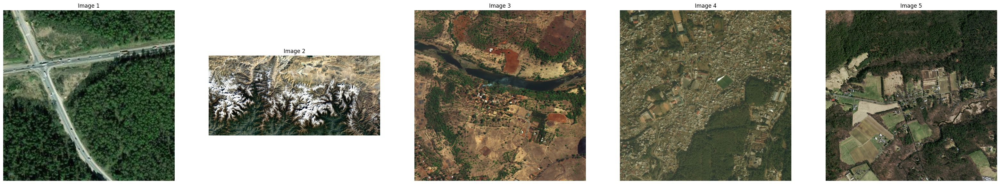

In [9]:
import random

def display_sample_images(image_list, num_images=5):
    if len(image_list) == 0:
        print("No images to display.")
        return

    display_count = min(len(image_list), num_images)

    # Random selection of images
    selected_images = random.sample(image_list, display_count)
    fig, axes = plt.subplots(1, display_count, figsize=(40, 20))

    # Loop through the selected images, displaying each in a subplot
    for i, img in enumerate(selected_images):
        ax = axes[i] if display_count > 1 else axes
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Image {i+1}")
    
    plt.show()

# Display images
display_sample_images(image_list, num_images=5)

# Exploratory Data Analysis

### Distribution of the categories and their counts

The distribution of categories and their counts gives us an understanding of what the data is composed of so we can understand the dataset characteristics. It helps with detecting imbalanced data, model bias assessment prior to model training, model perfomance estimation and for communication and collaboration between team members

Number of images in each folder:
Lands: 115 images
mountain: 105 images
Water: 104 images
Roads: 103 images


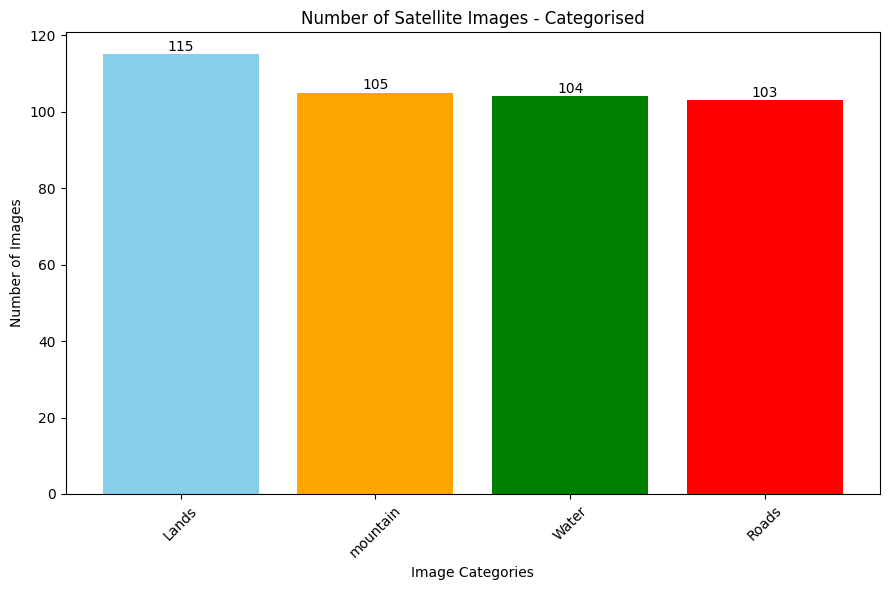

In [10]:
#//Notes: Previous Bar chart did not count the categories automatically//

# Bar chart to visually see the count of images in the folders

folder_counts = {}

# Loop through each folder and process images
for folder_name in folder_names:
# Retrieve objects in the folder
    response = s3_client.list_objects_v2(Bucket=bucket_name, Prefix=folder_name)
    
# Initialize count
    total_images = 0
    
    if 'Contents' in response:
# Filter and count JPEG and PNG files
        jpg_files = [obj['Key'] for obj in response['Contents'] if obj['Key'].lower().endswith('.jpg')]
        png_files = [obj['Key'] for obj in response['Contents'] if obj['Key'].lower().endswith('.png')]
        
# Combine JPEG and PNG files and count the total number of images in the folder
        total_images = len(jpg_files) + len(png_files)

# Store the count in the dictionary
    folder_counts[folder_name] = total_images

# Print the total number of images in each folder
print("Number of images in each folder:")
for folder_name, count in folder_counts.items():
    print(f"{folder_name}: {count} images")

# Generate a list of colors, cycling through a set list if there are many categories
colors = cycle(['skyblue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan'])

# Create a bar plot
plt.figure(figsize=(9, 6))
bars = plt.bar(range(len(folder_counts)), folder_counts.values(), align='center', color=[next(colors) for _ in folder_counts])

# Add the folder names as x-axis labels
plt.xticks(range(len(folder_counts)), folder_counts.keys(), rotation=45)

# Add count labels above each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.05, yval, ha='center', va='bottom')

# Add labels and title
plt.xlabel('Image Categories')
plt.ylabel('Number of Images')
plt.title('Number of Satellite Images - Categorised')

# Display the plot
plt.tight_layout()  # Adjust the plot to ensure everything fits without overlap
plt.show()

Number of images in each folder:
Lands: 115 images
mountain: 105 images
Water: 104 images
Roads: 103 images


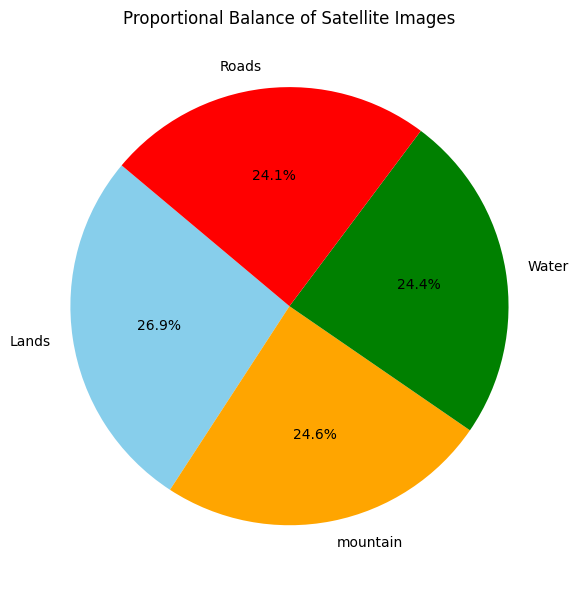

In [11]:
# Pie Chart is helpful for a proportional representation of our dataset

# Dictionary to store the count of images in each folder
folder_counts = {}

# Loop through each folder and process images
for folder_name in folder_names:
    # Retrieve objects in the folder
    response = s3_client.list_objects_v2(Bucket=bucket_name, Prefix=folder_name)
    
    # Initialize count
    total_images = 0
    
    if 'Contents' in response:
        # Filter and count JPEG and PNG files
        jpg_files = [obj['Key'] for obj in response['Contents'] if obj['Key'].lower().endswith('.jpg')]
        png_files = [obj['Key'] for obj in response['Contents'] if obj['Key'].lower().endswith('.png')]
        
        # Combine JPEG and PNG files and count the total number of images in the folder
        total_images = len(jpg_files) + len(png_files)

    # Store the count in the dictionary
    folder_counts[folder_name] = total_images

# Print the total number of images in each folder
print("Number of images in each folder:")
for folder_name, count in folder_counts.items():
    print(f"{folder_name}: {count} images")

# Generate a list of colors for the pie chart
colors = ['skyblue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(folder_counts.values(), labels=folder_counts.keys(), colors=colors, autopct='%1.1f%%', startangle=140)

# Add title
plt.title('Proportional Balance of Satellite Images')

# Display the plot
plt.tight_layout()  # Adjust the plot to ensure everything fits without overlap
plt.show()

## Data Processing

#### Converting the images to Tensor

Tensor conversion successful.


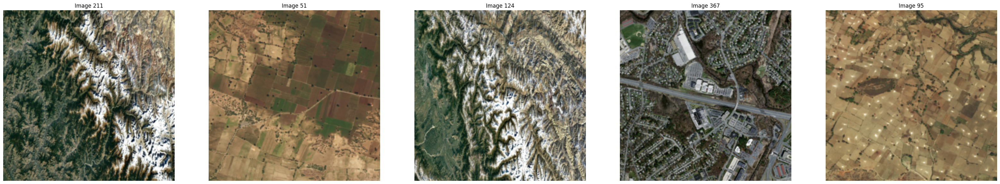

Min pixel value: 0.10594382
Max pixel value: 0.96643585
Data type: <dtype: 'float32'>


In [12]:
# TPreprocessing images - adjusting size and format to make them ready for further processing

def preprocess_image(image_array, target_size=(256, 256)):
    # Convert the image to float32 to reduce memory consumption
    image_array = image_array.astype(np.float32) / 255.0
    
    # Resize image
    image_resized = resize(image_array, target_size, anti_aliasing=True)
    
    # Standardize color channels: ensure all images are in RGB format
    if image_resized.ndim == 2:  # If the image is grayscale, convert it to RGB
        image_resized = gray2rgb(image_resized)
    elif image_resized.shape[2] == 4:  # If the image has an alpha channel, remove it
        image_resized = image_resized[..., :3]

    return image_resized

# Process list of images individually, applying transformations to each image for consistent size and colour format 
# Managing memory usage effectively & prevent crashes due to memory overflow
images = []
for img in image_list:
    try:
        processed_image = preprocess_image(img)
        images.append(processed_image)
    except MemoryError as e:
        print(f"MemoryError while processing the image: {e}")
# Handle the memory error, (e.g., by skipping the image or freeing up resources)
        break  # Exit the loop 

# Convert list of processed images into a TensorFlow tensor
# Displays five random images from this tensor; if no images are processed - print a statement to inform
if images:
    images_tensor = tf.convert_to_tensor(images, dtype=tf.float32)
    print("Tensor conversion successful.")

# Display 5 random images
    def display_random_images(images, num_images=5):
        plt.figure(figsize=(40, 20))
        indices = np.random.choice(images.shape[0], num_images, replace=False)
        for i, index in enumerate(indices):
            ax = plt.subplot(1, num_images, i + 1)
            plt.imshow(images[index])
            plt.title(f"Image {index+1}")
            plt.axis("off")
        plt.show()

    display_random_images(images_tensor)
else:
    print("No images that were processed.")
    print("Tensor conversion successful.")

# Verify the minimum and maximum pixel values and the data type 
# Helps ensure that the image data is correctly formatted and scaled for processing tasks

print("Min pixel value:", np.min(images_tensor[0]))
print("Max pixel value:", np.max(images_tensor[0]))

# Ensure that the dtype is float32
print("Data type:", images_tensor.dtype)

# //Note - If the min and max values reported are between 0 and 1, 
# //It indicates that the images are scaled appropriately - Neural Network Models expect inputs in this range

# Image segmentation

For our Image segmentation, we are building a UNet model using semantic segmentation model with a ResNet34 backbone for multi-class image segmentation , we are using it to make predictions on test images and visualize the results. 


Setting the framework for a deep learning model to TensorFlow's Keras API using the syntax sm.set_framework('tf.keras')


In [13]:
sm.set_framework('tf.keras')

In [14]:

# Define bucket name and target size for resizing
bucket_name = '2307-07-synthetic-segmentation-a'
target_size = (256, 256)

def load_and_process_images(folder_name):
    image_dataset = []
    try:
        response = s3_client.list_objects_v2(Bucket=bucket_name, Prefix=folder_name)
        image_files = [obj['Key'] for obj in response.get('Contents', []) if obj['Key'].lower().endswith(('.jpg', '.jpeg', '.png'))]
        for image_file in image_files:
            try:
                obj = s3_client.get_object(Bucket=bucket_name, Key=image_file)
                image_bytes = obj['Body'].read()
                image = Image.open(io.BytesIO(image_bytes))
                image_resized = image.resize(target_size)  # Resize the image
                if image_resized.mode != 'RGB':  # Ensure all images are in RGB mode
                    image_resized = image_resized.convert('RGB')
                image_array = np.array(image_resized)
                image_dataset.append(image_array)
            except Exception as e:
                print(f"Error processing {image_file}: {e}")
    except Exception as e:
        print(f"Error listing objects in folder {folder_name}: {e}")
    return image_dataset

# Load and process training images
train_images = load_and_process_images('train_image')

# Load and process mask images
train_masks = load_and_process_images('train_mask')

# Check dimensions
assert all(img.shape == (256, 256, 3) for img in train_images), "Some train images have incorrect dimensions"
assert all(mask.shape == (256, 256, 3) for mask in train_masks), "Some train masks have incorrect dimensions"

# Now train_images and train_masks contain NumPy arrays of consistently sized images and masks


In [15]:
mask_dataset = np.array(train_masks)
image_dataset = np.array(train_images)

In [16]:
image_dataset.shape

(60, 256, 256, 3)

In [17]:
mask_dataset.shape

(60, 256, 256, 3)

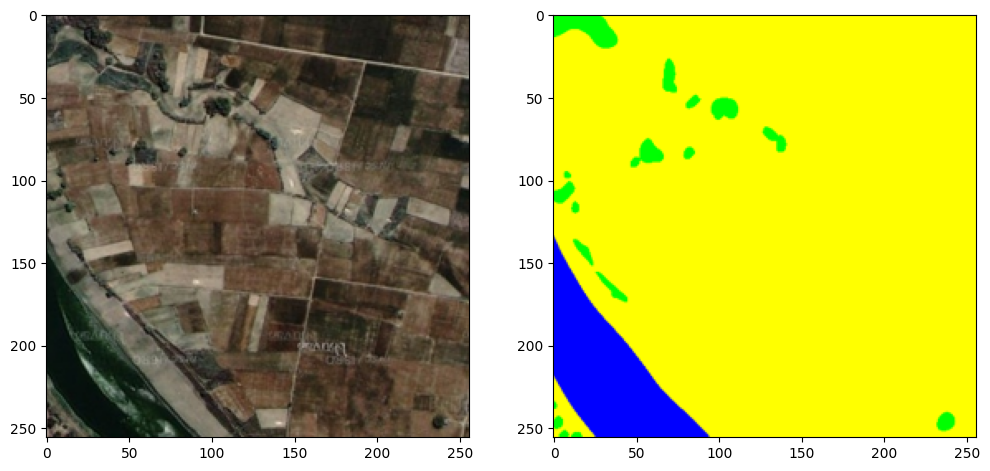

In [18]:
# Sanity check...
image_number = random.randint(0, len(image_dataset))
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(image_dataset[image_number])
plt.subplot(122)
plt.imshow(mask_dataset[image_number])
plt.show()

In [19]:
import pandas as pd
from io import StringIO

    # Specify the bucket name and file name
bucket_name = '2307-07-synthetic-segmentation-a'
file_key = 'class_dict_seg.csv'

#Initialize S3 client
s3_client = boto3.client(
service_name='s3',
region_name='eu-west-1',
aws_access_key_id=os.getenv("aws_access_key_id"),
aws_secret_access_key=os.getenv("aws_secret_access_key"))
    
def read_csv_from_s3(bucket_name, file_key):
    
    # Read CSV file from S3
    obj = s3_client.get_object(Bucket=bucket_name, Key=file_key)
    data = obj['Body'].read().decode('utf-8')
    
    # Convert CSV data to Pandas DataFrame
    mask_labels = pd.read_csv(StringIO(data))
    
    return mask_labels

mask_labels = read_csv_from_s3(bucket_name, file_key)
print(mask_labels.head())  # Display the first few rows of the DataFrame

     name    r    g    b
0   urban    0  255  255
1   water    0    0  255
2  forest    0  255    0
3    land  255  255    0
4    road  255    0  255


In [20]:
# converting 3 values (RGB) to 1 label values...
def rgb_to_labels(img, mask_labels):
    label_seg = np.zeros(img.shape,dtype=np.uint8)
    for i in range(mask_labels.shape[0]):
        label_seg[np.all(img == list(mask_labels.iloc[i, [1,2,3]]), axis=-1)] = i
    label_seg = label_seg[:,:,0]  #Just take the first channel, no need for all 3 channels...
    return label_seg

In [21]:
labels = []
for i in range(mask_dataset.shape[0]):
    label = rgb_to_labels(mask_dataset[i], mask_labels) # calling rgb to labels for each images...
    labels.append(label)

In [22]:
labels = np.array(labels)
labels = np.expand_dims(labels, axis=3) # adding channel dim...

Unique labels in label dataset are:  [0 1 2 3 4]


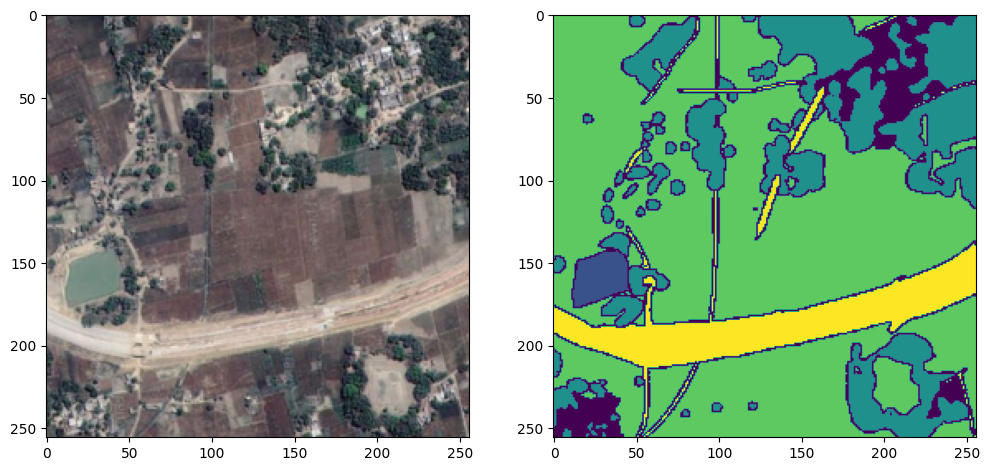

In [23]:
print("Unique labels in label dataset are: ", np.unique(labels))

#Another Sanity check...
image_number = random.randint(0, len(image_dataset))
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(image_dataset[image_number])
plt.subplot(122)
plt.imshow(labels[image_number][:,:,0])
plt.show()

In [24]:
n_classes = len(np.unique(labels)) # 5 classes...
labels_cat = to_categorical(labels, num_classes=n_classes) # one hot encoding the labels...

In [25]:
n_classes

5

In [26]:
X_train, X_test, y_train, y_test = train_test_split(image_dataset,
                                                    labels_cat, test_size = 0.20,
                                                    random_state = 42) # train test split for data...

### Modeling

In [27]:
# using weights from pretained resnet model...
BACKBONE = 'resnet34'
preprocess_input = sm.get_preprocessing(BACKBONE)

In [28]:
# preprocess input...
X_train_prepr = preprocess_input(X_train)
X_test_prepr = preprocess_input(X_test)

In [29]:
# define model...
model_resnet_backbone = sm.Unet(BACKBONE, encoder_weights='imagenet', classes=n_classes, activation='softmax')

In [30]:
# accuracy as metrics, adam optimizer and loss function that needs to be optimized is categorical crossentropy as its a multiclass classification problem...
metrics=['accuracy']
model_resnet_backbone.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)

Model summary

In [31]:
model_resnet_backbone.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ data (InputLayer)   │ (None, None,      │          0 │ -                 │
│                     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_data             │ (None, None,      │          9 │ data[0][0]        │
│ (BatchNormalizatio… │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, None,      │          0 │ bn_data[0][0]     │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv0 (Conv2D)      │ (None, None,      │      9,408 │ zero_padding2d[0… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn0                 │ (None, None,      │        256 │ conv0[0][0]       │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ relu0 (Activation)  │ (None, None,      │          0 │ bn0[0][0]         │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, None,      │          0 │ relu0[0][0]       │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pooling0            │ (None, None,      │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_bn1    │ (None, None,      │        256 │ pooling0[0][0]    │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_relu1  │ (None, None,      │          0 │ stage1_unit1_bn1… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, None,      │          0 │ stage1_unit1_rel… │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_conv1  │ (None, None,      │     36,864 │ zero_padding2d_2… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_bn2    │ (None, None,      │        256 │ stage1_unit1_con… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_relu2  │ (None, None,      │          0 │ stage1_unit1_bn2… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, None,      │          0 │ stage1_unit1_rel… │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_conv2  │ (None, None,      │     36,864 │ zero_padding2d_3… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_sc     │ (None, None,      │      4,096 │ stage1_unit1_rel

 Total params: 24,456,734 (93.30 MB)

 Trainable params: 24,439,384 (93.23 MB)

 Non-trainable params: 17,350 (67.77 KB)

Training the model for 80 Epochs

In [32]:
# training the model for X amount of epochs with batch size of 16...
history = model_resnet_backbone.fit(X_train_prepr,
          y_train,
          batch_size=16,
          epochs=20,
          verbose=1,
          validation_data=(X_test_prepr, y_test))

Epoch 1/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 44s 9s/step - accuracy: 0.2249 - loss: 1.8169 - val_accuracy: 0.1299 - val_loss: 4.3263
Epoch 2/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 7s/step - accuracy: 0.5530 - loss: 1.3607 - val_accuracy: 0.1064 - val_loss: 20.5250
Epoch 3/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - accuracy: 0.6833 - loss: 1.1070 - val_accuracy: 0.1063 - val_loss: 40.7522
Epoch 4/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - accuracy: 0.7196 - loss: 0.9603 - val_accuracy: 0.1099 - val_loss: 58.6846
Epoch 5/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - accuracy: 0.7597 - loss: 0.8390 - val_accuracy: 0.1147 - val_loss: 132.5979
Epoch 6/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - accuracy: 0.7695 - loss: 0.7301 - val_accuracy: 0.1152 - val_loss: 363.5814
Epoch 7/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - accuracy: 0.7881 - loss: 0.6670 - val_accuracy: 0.1166 - val_loss: 841.1199
Epoch 8/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - accuracy: 0.8028 - loss: 0.6098 - val_accuracy: 0.1189 - val_loss: 927.48

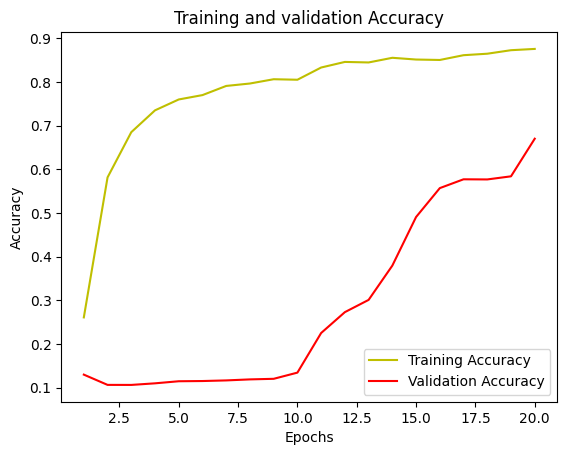

In [33]:
# plotting train and val accuracy in each epoch...
history = history
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, 'y', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [34]:
model_resnet_backbone.save('resnet_backbone.hdf5')

In [35]:
model = load_model('resnet_backbone.hdf5') # loading model...

In [36]:
# making predictions...
y_pred=model.predict(X_test)
y_pred_argmax=np.argmax(y_pred, axis=3)
y_test_argmax=np.argmax(y_test, axis=3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [37]:
# randomly selecting an image from the test set and making prediction...
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test_argmax[test_img_number]
#test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


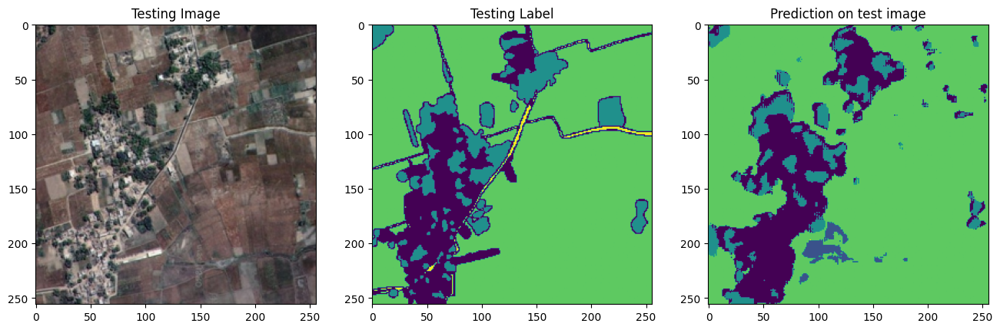

In [38]:
def predict_and_plot_random_image(model, X_test, y_test_argmax):
    # Randomly selecting an image from the test set and making prediction...
    test_img_number = random.randint(0, len(X_test) - 1)
    test_img = X_test[test_img_number]
    ground_truth = y_test_argmax[test_img_number]
    test_img_input = np.expand_dims(test_img, 0)
    prediction = model.predict(test_img_input)
    predicted_img = np.argmax(prediction, axis=3)[0,:,:]

    # Plotting the real image, test labeled image, and predicted labeled image...
    plt.figure(figsize=(16, 12))
    plt.subplot(231)
    plt.title('Testing Image')
    plt.imshow(test_img)
    plt.subplot(232)
    plt.title('Testing Label')
    plt.imshow(ground_truth)
    plt.subplot(233)
    plt.title('Prediction on test image')
    plt.imshow(predicted_img)
    plt.show()

# Call the function to predict and plot a random image
predict_and_plot_random_image(model, X_test, y_test_argmax)

##  From here the notebook is a continuation from the segmantation model to further train the Generative Adversarial Network (GAN)

While a GAN consists of two neural networks—a generator and a discriminator—competing against each other in a minimax game, a cGAN adds additional conditioning information to both the generator and the discriminator.

### Data Loading and Prep

 Prepares image data and corresponding outlines for a computer program. It organizes the data, applies transformations, and sets up a loader for training a model to recognize objects in images along with their outlines.

In [39]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

# Assuming `train_images` and `train_masks` are already loaded as NumPy arrays
train_images = np.random.randint(0, 256, (100, 3, 256, 256), dtype=np.uint8)  # Dummy data for example
train_masks = np.random.randint(0, 256, (100, 3, 256, 256), dtype=np.uint8)  # Dummy data for example

class SegmentationDataset(Dataset):
    def __init__(self, image_dataset, mask_dataset, transform=None):
        self.image_dataset = image_dataset
        self.mask_dataset = mask_dataset
        self.transform = transform

    def __len__(self):
        return len(self.image_dataset)

    def __getitem__(self, idx):
        image = self.image_dataset[idx]
        mask = self.mask_dataset[idx]
        
        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        
        return image, mask

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((128, 128)),  # Smaller size for testing
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

image_dataset = np.array(train_images)
mask_dataset = np.array(train_masks)

dataset = SegmentationDataset(image_dataset, mask_dataset, transform=transform)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)


### Conditional Gan Model (Model Definition)

The Generator takes random noise and class labels as input and produces images as output. It uses several neural network layers to transform the input noise and labels into an image. The goal is to generate realistic-looking images corresponding to the given class labels.

In [40]:
import torch.nn as nn

class Generator(nn.Module):
    def __init__(self, noise_dim, num_classes, img_shape):
        super(Generator, self).__init__()
        self.label_embedding = nn.Embedding(num_classes, num_classes)
        self.init_size = img_shape[1] // 4
        self.l1 = nn.Sequential(nn.Linear(noise_dim + num_classes, 128 * self.init_size ** 2))

        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, img_shape[0], 3, stride=1, padding=1),
            nn.Tanh(),
        )

    def forward(self, noise, labels):
        gen_input = torch.cat((self.label_embedding(labels), noise), -1)
        out = self.l1(gen_input)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img


The Discriminator takes images and class labels as input and outputs a probability indicating whether the input image is real or fake. It uses several fully connected layers with dropout and leaky ReLU activations to process the input image and label information. The goal is to distinguish between real and fake images effectively based on the given class labels.

In [41]:
class Discriminator(nn.Module):
    def __init__(self, img_shape, num_classes):
        super(Discriminator, self).__init__()
        self.label_embedding = nn.Embedding(num_classes, num_classes)
        self.model = nn.Sequential(
            nn.Linear(num_classes + int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1),
            nn.Sigmoid(),
        )

    def forward(self, img, labels):
        d_in = torch.cat((img.view(img.size(0), -1), self.label_embedding(labels)), -1)
        validity = self.model(d_in)
        return validity


### Training Loop

The models for the Generator and Discriminator, loads the data, sets up training parameters and optimizers, and implements the training loop. During training, it periodically displays generated images for visualization and includes error handling for exceptions.

Starting training...
Epoch 0/5
Batch 0: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 0/13] [D loss: 8.629927635192871] [G loss: 0.02745632454752922]


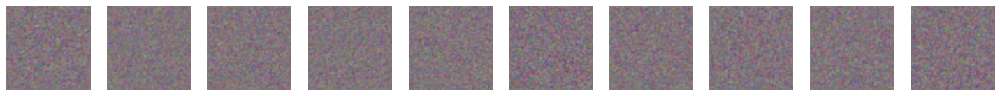

Batch 1: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 1/13] [D loss: 8.617964744567871] [G loss: 0.11056357622146606]
Batch 2: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 2/13] [D loss: 8.223766326904297] [G loss: 0.19424429535865784]
Batch 3: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 3/13] [D loss: 7.965775489807129] [G loss: 0.3071170151233673]
Batch 4: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 4/13] [D loss: 7.488393306732178] [G loss: 0.40474754571914673]
Batch 5: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 5/13] [D loss: 7.166474342346191] [G loss: 0.4834112524986267]


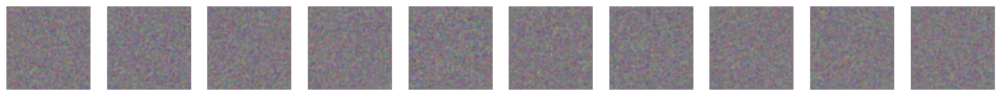

Batch 6: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 6/13] [D loss: 6.517363548278809] [G loss: 0.6069425940513611]
Batch 7: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 7/13] [D loss: 5.982490539550781] [G loss: 0.6261411905288696]
Batch 8: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 8/13] [D loss: 5.287668704986572] [G loss: 0.6117252707481384]
Batch 9: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 9/13] [D loss: 5.053062438964844] [G loss: 0.5871742963790894]
Batch 10: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 10/13] [D loss: 4.35783576965332] [G loss: 0.5528926849365234]


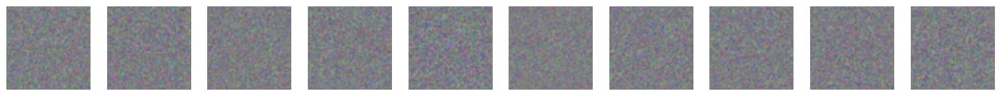

Batch 11: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 0/5] [Batch 11/13] [D loss: 4.443671226501465] [G loss: 0.3639686107635498]
Batch 12: imgs.shape=torch.Size([4, 3, 128, 128]), masks.shape=torch.Size([4, 3, 128, 128])
[Epoch 0/5] [Batch 12/13] [D loss: 3.08526349067688] [G loss: 0.23048345744609833]
Epoch 1/5
Batch 0: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 0/13] [D loss: 5.082122325897217] [G loss: 0.017132502049207687]


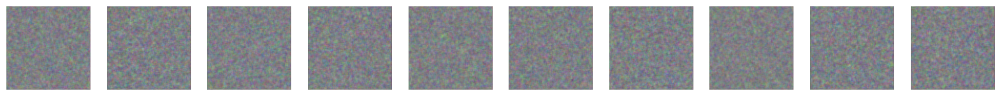

Batch 1: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 1/13] [D loss: 5.551264762878418] [G loss: -0.13629987835884094]
Batch 2: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 2/13] [D loss: 4.6913161277771] [G loss: -0.3489219844341278]
Batch 3: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 3/13] [D loss: 3.9325151443481445] [G loss: -0.5242033004760742]
Batch 4: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 4/13] [D loss: 3.1785309314727783] [G loss: -0.8256948590278625]
Batch 5: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 5/13] [D loss: 2.499023675918579] [G loss: -1.0721921920776367]


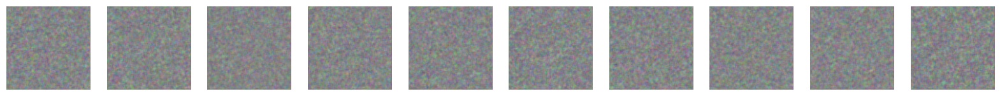

Batch 6: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 6/13] [D loss: 2.1336669921875] [G loss: -1.2318155765533447]
Batch 7: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 7/13] [D loss: 0.8421400785446167] [G loss: -1.3074913024902344]
Batch 8: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 8/13] [D loss: 0.11943116784095764] [G loss: -1.061476707458496]
Batch 9: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 9/13] [D loss: 0.035103559494018555] [G loss: -0.6780431270599365]
Batch 10: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 10/13] [D loss: 1.1839816570281982] [G loss: -0.3788488805294037]


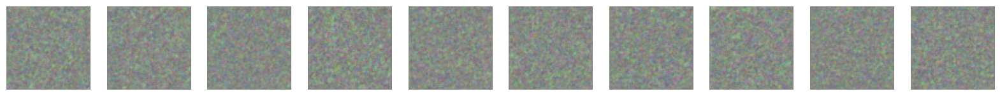

Batch 11: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 1/5] [Batch 11/13] [D loss: 0.6483515501022339] [G loss: -0.286085307598114]
Batch 12: imgs.shape=torch.Size([4, 3, 128, 128]), masks.shape=torch.Size([4, 3, 128, 128])
[Epoch 1/5] [Batch 12/13] [D loss: -0.9258440136909485] [G loss: -0.1883637011051178]
Epoch 2/5
Batch 0: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 0/13] [D loss: -1.735275149345398] [G loss: -0.2908889949321747]


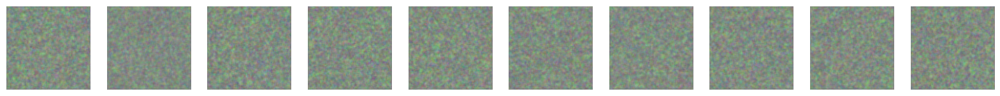

Batch 1: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 1/13] [D loss: -1.7363085746765137] [G loss: -0.3070460557937622]
Batch 2: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 2/13] [D loss: -1.6389031410217285] [G loss: -0.40952593088150024]
Batch 3: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 3/13] [D loss: -2.7407517433166504] [G loss: -0.12612107396125793]
Batch 4: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 4/13] [D loss: -1.4449037313461304] [G loss: 0.07708096504211426]
Batch 5: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 5/13] [D loss: -1.4430161714553833] [G loss: 0.37353771924972534]


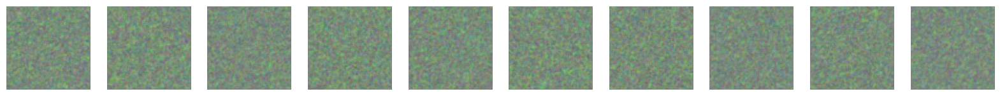

Batch 6: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 6/13] [D loss: -1.2775306701660156] [G loss: 0.5975663065910339]
Batch 7: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 7/13] [D loss: -2.4898934364318848] [G loss: 0.7997965216636658]
Batch 8: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 8/13] [D loss: -2.3510117530822754] [G loss: 1.2876620292663574]
Batch 9: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 9/13] [D loss: -3.6590263843536377] [G loss: 1.867945671081543]
Batch 10: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 10/13] [D loss: -4.046342849731445] [G loss: 2.7401092052459717]


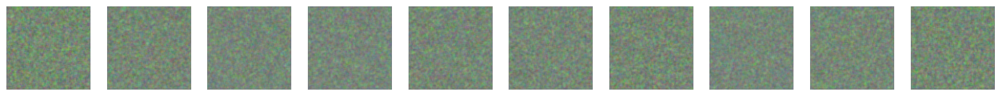

Batch 11: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 2/5] [Batch 11/13] [D loss: -5.102450370788574] [G loss: 4.092569828033447]
Batch 12: imgs.shape=torch.Size([4, 3, 128, 128]), masks.shape=torch.Size([4, 3, 128, 128])
[Epoch 2/5] [Batch 12/13] [D loss: -6.613964080810547] [G loss: 4.8008623123168945]
Epoch 3/5
Batch 0: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 0/13] [D loss: -7.5257062911987305] [G loss: 5.867284297943115]


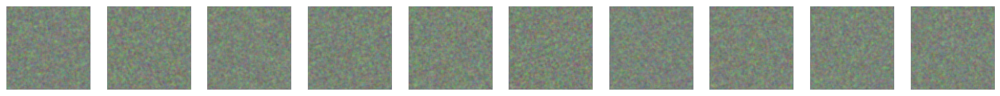

Batch 1: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 1/13] [D loss: -9.516432762145996] [G loss: 6.146195411682129]
Batch 2: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 2/13] [D loss: -7.953640460968018] [G loss: 6.562920093536377]
Batch 3: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 3/13] [D loss: -6.0104265213012695] [G loss: 6.100261688232422]
Batch 4: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 4/13] [D loss: -4.9127516746521] [G loss: 5.105185031890869]
Batch 5: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 5/13] [D loss: -5.524243354797363] [G loss: 4.009206771850586]


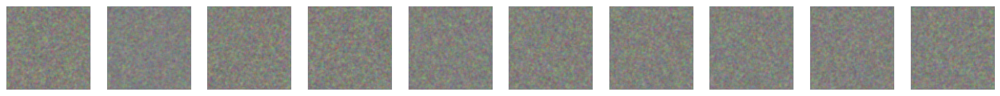

Batch 6: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 6/13] [D loss: -2.7103946208953857] [G loss: 2.5161380767822266]
Batch 7: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 7/13] [D loss: -2.358124256134033] [G loss: 1.354402780532837]
Batch 8: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 8/13] [D loss: -2.3890247344970703] [G loss: 0.18944872915744781]
Batch 9: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 9/13] [D loss: -2.544609546661377] [G loss: -0.16571003198623657]
Batch 10: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 10/13] [D loss: -2.6644628047943115] [G loss: -0.29118746519088745]


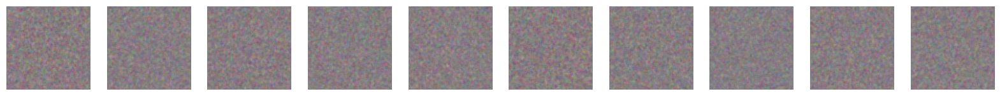

Batch 11: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 3/5] [Batch 11/13] [D loss: -2.713918685913086] [G loss: -0.3307756781578064]
Batch 12: imgs.shape=torch.Size([4, 3, 128, 128]), masks.shape=torch.Size([4, 3, 128, 128])
[Epoch 3/5] [Batch 12/13] [D loss: -2.379810333251953] [G loss: -0.26254066824913025]
Epoch 4/5
Batch 0: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 0/13] [D loss: -3.0806233882904053] [G loss: -0.2750134766101837]


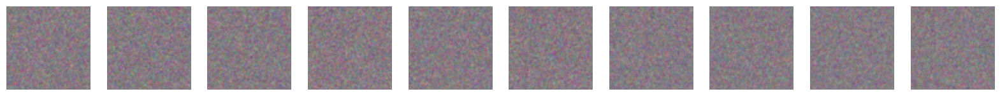

Batch 1: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 1/13] [D loss: -3.086655616760254] [G loss: -0.16171856224536896]
Batch 2: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 2/13] [D loss: -3.383244037628174] [G loss: -0.1346098929643631]
Batch 3: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 3/13] [D loss: -3.4361190795898438] [G loss: -0.03127850219607353]
Batch 4: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 4/13] [D loss: -3.536928653717041] [G loss: -0.041756123304367065]
Batch 5: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 5/13] [D loss: -2.7914652824401855] [G loss: -0.10996533930301666]


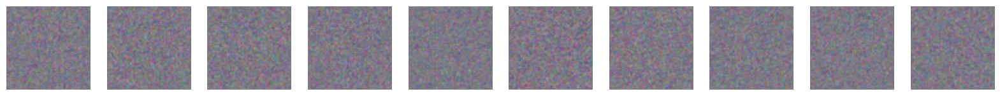

Batch 6: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 6/13] [D loss: -3.3391594886779785] [G loss: 0.10782159119844437]
Batch 7: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 7/13] [D loss: -3.0063610076904297] [G loss: 0.20905964076519012]
Batch 8: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 8/13] [D loss: -3.146632671356201] [G loss: 0.4283222258090973]
Batch 9: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 9/13] [D loss: -4.5599517822265625] [G loss: 0.9248253703117371]
Batch 10: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 10/13] [D loss: -3.740009069442749] [G loss: 1.1546564102172852]


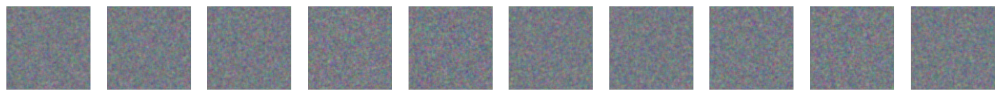

Batch 11: imgs.shape=torch.Size([8, 3, 128, 128]), masks.shape=torch.Size([8, 3, 128, 128])
[Epoch 4/5] [Batch 11/13] [D loss: -3.816098213195801] [G loss: 1.4960057735443115]
Batch 12: imgs.shape=torch.Size([4, 3, 128, 128]), masks.shape=torch.Size([4, 3, 128, 128])
[Epoch 4/5] [Batch 12/13] [D loss: -3.816953420639038] [G loss: 1.91163969039917]
Training completed.


In [42]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import torch.optim as optim
import matplotlib.pyplot as plt

# Create dummy data for example
train_images = np.random.randint(0, 256, (100, 256, 256, 3), dtype=np.uint8)  # Dummy data, 100 RGB images of size 256x256
train_masks = np.random.randint(0, 256, (100, 256, 256, 3), dtype=np.uint8)  # Dummy data, 100 RGB masks of size 256x256

class SegmentationDataset(Dataset):
    def __init__(self, image_dataset, mask_dataset, transform=None):
        self.image_dataset = image_dataset
        self.mask_dataset = mask_dataset
        self.transform = transform

    def __len__(self):
        return len(self.image_dataset)

    def __getitem__(self, idx):
        image = self.image_dataset[idx]
        mask = self.mask_dataset[idx]
        
        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        
        return image, mask

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((128, 128)),  # Smaller size for testing
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

image_dataset = np.array(train_images)
mask_dataset = np.array(train_masks)

dataset = SegmentationDataset(image_dataset, mask_dataset, transform=transform)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

# Simplified Generator Model
class Generator(nn.Module):
    def __init__(self, noise_dim, num_classes, img_shape):
        super(Generator, self).__init__()
        self.label_embedding = nn.Embedding(num_classes, num_classes)
        self.init_size = img_shape[1] // 4
        self.l1 = nn.Sequential(nn.Linear(noise_dim + num_classes, 128 * self.init_size ** 2))

        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, img_shape[0], 3, stride=1, padding=1),
            nn.Tanh(),
        )

    def forward(self, noise, labels):
        gen_input = torch.cat((self.label_embedding(labels), noise), -1)
        out = self.l1(gen_input)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

# Simplified Discriminator Model
class Discriminator(nn.Module):
    def __init__(self, img_shape, num_classes):
        super(Discriminator, self).__init__()
        self.label_embedding = nn.Embedding(num_classes, num_classes)
        self.model = nn.Sequential(
            nn.Linear(num_classes + int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1),
        )

    def forward(self, img, labels):
        d_in = torch.cat((img.view(img.size(0), -1), self.label_embedding(labels)), -1)
        validity = self.model(d_in)
        return validity

# Parameters
img_shape = (3, 128, 128)  # Smaller size for testing
num_classes = 2  # Binary segmentation
noise_dim = 100
batch_size = 8  # Reduced batch size to minimize memory usage
num_epochs = 5  # Increase epochs to see improvement over time
sample_interval = 5  # Reduce sample interval for more frequent updates
lambda_gp = 10  # Gradient penalty coefficient
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize generator and discriminator
generator = Generator(noise_dim, num_classes, img_shape).to(device)
discriminator = Discriminator(img_shape, num_classes).to(device)

# Weight initialization
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=0.0001, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0001, betas=(0.5, 0.999))

# Loss function
adversarial_loss = torch.nn.BCELoss().to(device)

# Gradient penalty function
def compute_gradient_penalty(D, real_samples, fake_samples, labels):
    alpha = torch.rand(real_samples.size(0), 1, 1, 1).to(device)
    interpolates = (alpha * real_samples + (1 - alpha) * fake_samples).requires_grad_(True)
    d_interpolates = D(interpolates, labels)
    fake = torch.ones(real_samples.size(0), 1).to(device)
    gradients = torch.autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty

# Function to display generated images
def display_generated_images(epoch, generator, noise_dim, num_classes):
    z = torch.randn(10, noise_dim).to(device)
    labels = torch.randint(0, num_classes, (10,)).to(device)
    gen_imgs = generator(z, labels)
    gen_imgs = gen_imgs * 0.5 + 0.5  # Rescale images 0 - 1

    fig, axs = plt.subplots(1, 10, figsize=(20, 2))
    for i in range(10):
        axs[i].imshow(gen_imgs[i].detach().cpu().numpy().transpose(1, 2, 0))
        axs[i].axis('off')
    plt.show()

# Debugging statements
print("Starting training...")

try:
    for epoch in range(num_epochs):
        print(f"Epoch {epoch}/{num_epochs}")
        for i, (imgs, masks) in enumerate(dataloader):
            
            # Debugging: Print shapes of the data
            print(f"Batch {i}: imgs.shape={imgs.shape}, masks.shape={masks.shape}")
            
            # Move data to the appropriate device
            imgs, masks = imgs.to(device), masks.to(device)
            
            # Ground truths
            valid = torch.ones(imgs.size(0), 1, requires_grad=False).to(device) * 0.9  # Label smoothing
            fake = torch.zeros(imgs.size(0), 1, requires_grad=False).to(device)
            
            # Configure input
            real_imgs = imgs.type(torch.FloatTensor).to(device)
            real_masks = masks.type(torch.FloatTensor).to(device)
            
            # Generate labels (binary for segmentation)
            labels = torch.randint(0, num_classes, (imgs.size(0),)).type(torch.LongTensor).to(device)
            
            # -----------------
            # Train Generator
            # -----------------
            optimizer_G.zero_grad()
            
            # Sample noise and labels as generator input
            z = torch.randn(imgs.size(0), noise_dim).to(device)
            gen_labels = torch.randint(0, num_classes, (imgs.size(0),)).to(device)
            
            # Generate a batch of images
            gen_imgs = generator(z, gen_labels)
            
            # Loss measures generator's ability to fool the discriminator
            validity = discriminator(gen_imgs, gen_labels)
            g_loss = -torch.mean(validity)
            
            g_loss.backward()
            nn.utils.clip_grad_norm_(generator.parameters(), 1.0)  # Gradient clipping
            optimizer_G.step()
            
            # ---------------------
            # Train Discriminator
            # ---------------------
            optimizer_D.zero_grad()
            
            # Loss for real images
            validity_real = discriminator(real_imgs, labels)
            d_real_loss = -torch.mean(validity_real)
            
            # Loss for fake images
            validity_fake = discriminator(gen_imgs.detach(), gen_labels)
            d_fake_loss = torch.mean(validity_fake)
            
            # Gradient penalty
            gradient_penalty = compute_gradient_penalty(discriminator, real_imgs.data, gen_imgs.data, labels)
            
            # Total discriminator loss
            d_loss = d_real_loss + d_fake_loss + lambda_gp * gradient_penalty
            
            d_loss.backward()
            nn.utils.clip_grad_norm_(discriminator.parameters(), 1.0)  # Gradient clipping
            optimizer_D.step()
            
            print(f"[Epoch {epoch}/{num_epochs}] [Batch {i}/{len(dataloader)}] [D loss: {d_loss.item()}] [G loss: {g_loss.item()}]")
            
            if i % sample_interval == 0:
                display_generated_images(epoch, generator, noise_dim, num_classes)

    print("Training completed.")

except Exception as e:
    print(f"An error occurred: {e}")
